#様々な環境下での顔認証検証

今回は主に二つのケースで、顔認証がうまく機能するのかを調べていきます。
調べるケースは次の二つ。
・混雑した状況下での人数のカウント
・水中での顔認証

In [53]:
%pip install ultralytics dill opencv-python matplotlib facenet-pytorch mtcnn
# 必要なライブラリを一度にインストールします（ノートブック内で実行）。

Note: you may need to restart the kernel to use updated packages.


まずはYOLOをインストールして、１つ目の混雑状況の画像を検証していきます。
元の画像はこちらです。

![alt text](240_F_533045957_8QzyF3ruKMPzNQQypsEyqtGWdvq2hnSt.jpg)

検出された顔の数: 6 faces


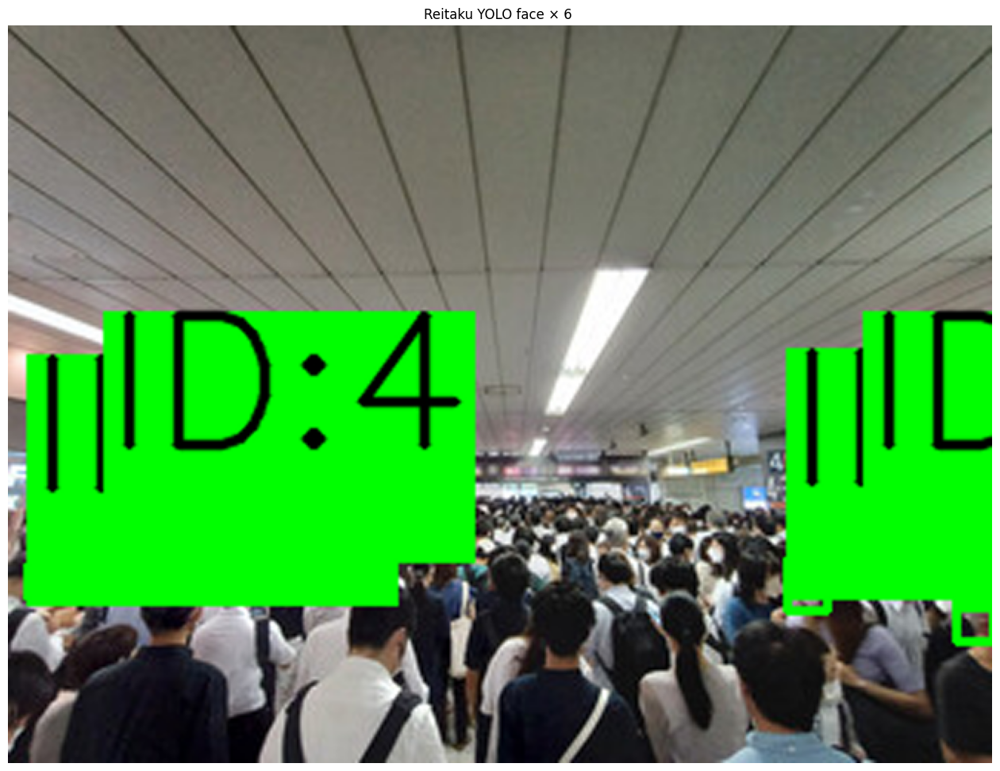

In [54]:
import cv2
from pathlib import Path
from ultralytics import YOLO
import matplotlib.pyplot as plt

# 画像とモデルの準備
image_path = Path("240_F_533045957_8QzyF3ruKMPzNQQypsEyqtGWdvq2hnSt.jpg")
model_path = Path("yolov8m-face.pt")

# YOLO で高解像度推論（imgsz を指定）
model = YOLO(model_path)
result = model.predict(source=str(image_path), conf=0.25, verbose=False, imgsz=1280)[0]

# 画像読み込みと基本情報
annotated = cv2.imread(str(image_path))
h_img, w_img = annotated.shape[:2]
color = (0,255,0)
font_scale = 2
thickness = 2

# 検出結果を描画（バッファ付き）
for idx, box in enumerate(result.boxes.xyxy.cpu().numpy()):
    x1,y1,x2,y2 = map(int, box)
    w = x2 - x1; h = y2 - y1
    pad = int(max(w,h) * 0.2)  # バッファ 20%
    x1p = max(0, x1 - pad); y1p = max(0, y1 - pad)
    x2p = min(w_img, x2 + pad); y2p = min(h_img, y2 + pad)
    cv2.rectangle(annotated, (x1p,y1p), (x2p,y2p), color, thickness)
    label = f"ID:{idx}"
    (w_label, h_label), baseline = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    y_label = y1p-6 if y1p-6>h_label else y1p+h_label+6
    cv2.rectangle(annotated, (x1p, y_label-h_label-baseline), (x1p+w_label, y_label+baseline), color, -1)
    cv2.putText(annotated, label, (x1p, y_label-baseline), cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0,0,0), thickness, cv2.LINE_AA)

# 高解像度で保存（アップスケールして保存）
output_path = Path("reitaku_yolo_faces.jpg")
annot_up = cv2.resize(annotated, (w_img*2, h_img*2), interpolation=cv2.INTER_CUBIC)
cv2.imwrite(str(output_path), annot_up)
print(f"検出された顔の数: {len(result.boxes)} faces")
plt.figure(figsize=(16,16))
plt.imshow(cv2.cvtColor(annot_up, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title(f'Reitaku YOLO face × {len(result.boxes)} ')
plt.show()

文字やラベルが多き表示されてしまい、見にくくなってしまいました
六人もの顔が検出されたにもかかわらずどこで何人検出されているのかがわかりずらいです。
そのためラベルを全体的に小さくして見やすい画像にしていきます。

検出された顔の数: 6 faces


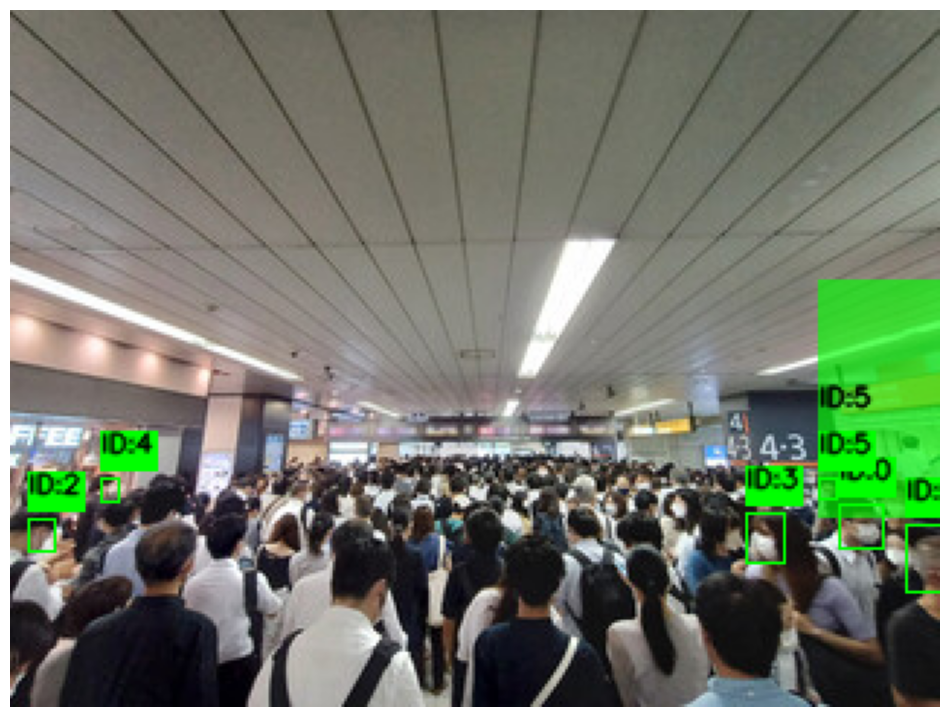

In [55]:
import cv2
from pathlib import Path
from ultralytics import YOLO
import matplotlib.pyplot as plt

# 画像とモデルの準備
image_path = Path("240_F_533045957_8QzyF3ruKMPzNQQypsEyqtGWdvq2hnSt.jpg")
model_path = Path("yolov8m-face.pt")

model = YOLO(model_path)
result = model.predict(source=str(image_path), conf=0.25, verbose=False, imgsz=1280)[0]

# 画像読み込み
annotated = cv2.imread(str(image_path))
h_img, w_img = annotated.shape[:2]

# ★ 小さめのラベルサイズ
font_scale = 0.3
thickness = 1
color = (0, 255, 0)

# ---- ラベル背景（半透明） ----
overlay = annotated.copy()
alpha = 0.4   # ← 透明度（0〜1） 小さいほど薄い

# 半透明背景矩形
cv2.rectangle(
    overlay,
    (x1p, y_label - h_label - baseline),
    (x1p + w_label, y_label + baseline),
    color,
    -1
)

# αブレンド（overlay と annotated を合成）
cv2.addWeighted(overlay, alpha, annotated, 1 - alpha, 0, annotated)

# ---- 文字 ----
cv2.putText(
    annotated,
    label,
    (x1p, y_label - baseline),
    cv2.FONT_HERSHEY_SIMPLEX,
    font_scale,
    (0, 0, 0),
    thickness,
    cv2.LINE_AA
)

# ---- ラベル背景（半透明） ----
overlay = annotated.copy()
alpha = 0.4   # ← 透明度（0〜1） 小さいほど薄い

# 半透明背景矩形
cv2.rectangle(
    overlay,
    (x1p, y_label - h_label - baseline),
    (x1p + w_label, y_label + baseline),
    color,
    -1
)

# αブレンド（overlay と annotated を合成）
cv2.addWeighted(overlay, alpha, annotated, 1 - alpha, 0, annotated)

# ---- 文字 ----
cv2.putText(
    annotated,
    label,
    (x1p, y_label - baseline),
    cv2.FONT_HERSHEY_SIMPLEX,
    font_scale,
    (0, 0, 0),
    thickness,
    cv2.LINE_AA
)

# 描画
for idx, box in enumerate(result.boxes.xyxy.cpu().numpy()):
    x1, y1, x2, y2 = map(int, box)
    w = x2 - x1
    h = h = y2 - y1
    pad = int(max(w, h) * 0.2)

    x1p = max(0, x1 - pad)
    y1p = max(0, y1 - pad)
    x2p = min(w_img, x2 + pad)
    y2p = min(h_img, y2 + pad)

    # ボックス
    cv2.rectangle(annotated, (x1p, y1p), (x2p, y2p), color, thickness)

    # ラベル
    label = f"ID:{idx}"
    (w_label, h_label), baseline = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    y_label = y1p - 6 if y1p - 6 > h_label else y1p + h_label + 6

    cv2.rectangle(annotated, (x1p, y_label - h_label - baseline),
                  (x1p + w_label, y_label + baseline), color, -1)

    cv2.putText(annotated, label, (x1p, y_label - baseline),
                cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 0, 0),
                thickness, cv2.LINE_AA)

# ★ アップスケールしないで保存
output_path = Path("reitaku_yolo_faces_fixed.jpg")
cv2.imwrite(str(output_path), annotated)

print(f"検出された顔の数: {len(result.boxes)} faces")

# ★ 表示だけ拡大
plt.figure(figsize=(12, 12))
plt.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


まだ少し大きいですが、左側で２人、右側で４人検出されているのがわかるようになりました。

#結果
画質が悪いこともあり比較的手前の人の顔を検出している。
ID2の方のようにほとんど後ろ向きであっても検出できる場合がある。
マスクをしていてもしっかり検出できる。

次に２つ目の集団画像の顔検出を行っていきます！
もとの画像はこちらです

![alt text](240_F_94124924_wPmICWypNd53ZBcLGC5oulJor43l461q.jpg)

検出された顔の数: 27 faces


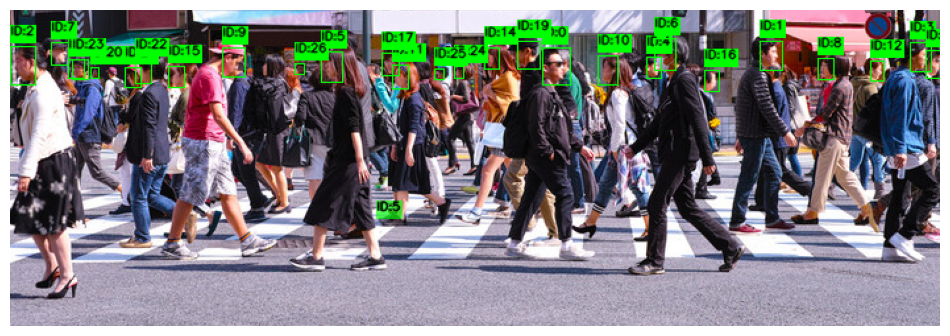

In [56]:
import cv2
from pathlib import Path
from ultralytics import YOLO
import matplotlib.pyplot as plt

# 画像とモデルの準備
image_path = Path("240_F_94124924_wPmICWypNd53ZBcLGC5oulJor43l461q.jpg")
model_path = Path("yolov8m-face.pt")

model = YOLO(model_path)
result = model.predict(source=str(image_path), conf=0.25, verbose=False, imgsz=1280)[0]

# 画像読み込み
annotated = cv2.imread(str(image_path))
h_img, w_img = annotated.shape[:2]

# ★ 小さめのラベルサイズ
font_scale = 0.3
thickness = 1
color = (0, 255, 0)

# ---- ラベル背景（半透明） ----
overlay = annotated.copy()
alpha = 0.4   # ← 透明度（0〜1） 小さいほど薄い

# 半透明背景矩形
cv2.rectangle(
    overlay,
    (x1p, y_label - h_label - baseline),
    (x1p + w_label, y_label + baseline),
    color,
    -1
)

# αブレンド（overlay と annotated を合成）
cv2.addWeighted(overlay, alpha, annotated, 1 - alpha, 0, annotated)

# ---- 文字 ----
cv2.putText(
    annotated,
    label,
    (x1p, y_label - baseline),
    cv2.FONT_HERSHEY_SIMPLEX,
    font_scale,
    (0, 0, 0),
    thickness,
    cv2.LINE_AA
)

# ---- ラベル背景（半透明） ----
overlay = annotated.copy()
alpha = 0.4   # ← 透明度（0〜1） 小さいほど薄い

# 半透明背景矩形
cv2.rectangle(
    overlay,
    (x1p, y_label - h_label - baseline),
    (x1p + w_label, y_label + baseline),
    color,
    -1
)

# αブレンド（overlay と annotated を合成）
cv2.addWeighted(overlay, alpha, annotated, 1 - alpha, 0, annotated)

# ---- 文字 ----
cv2.putText(
    annotated,
    label,
    (x1p, y_label - baseline),
    cv2.FONT_HERSHEY_SIMPLEX,
    font_scale,
    (0, 0, 0),
    thickness,
    cv2.LINE_AA
)

# 描画
for idx, box in enumerate(result.boxes.xyxy.cpu().numpy()):
    x1, y1, x2, y2 = map(int, box)
    w = x2 - x1
    h = h = y2 - y1
    pad = int(max(w, h) * 0.2)

    x1p = max(0, x1 - pad)
    y1p = max(0, y1 - pad)
    x2p = min(w_img, x2 + pad)
    y2p = min(h_img, y2 + pad)

    # ボックス
    cv2.rectangle(annotated, (x1p, y1p), (x2p, y2p), color, thickness)

    # ラベル
    label = f"ID:{idx}"
    (w_label, h_label), baseline = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    y_label = y1p - 6 if y1p - 6 > h_label else y1p + h_label + 6

    cv2.rectangle(annotated, (x1p, y_label - h_label - baseline),
                  (x1p + w_label, y_label + baseline), color, -1)

    cv2.putText(annotated, label, (x1p, y_label - baseline),
                cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 0, 0),
                thickness, cv2.LINE_AA)

# ★ アップスケールしないで保存
output_path = Path("shuudann2_yolo_faces_fixed.jpg")
cv2.imwrite(str(output_path), annotated)

print(f"検出された顔の数: {len(result.boxes)} faces")

# ★ 表示だけ拡大
plt.figure(figsize=(12, 12))
plt.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


#結果
27人検出されました。
横顔でも問題なく検出可能。
マスクだけでなく帽子やサングラスを付けていてもしっかり検出できている。
ID26やID25のような私たちでも拡大しないと判別できないような遠くの人の顔も検出できている。
ID5のような失敗もあるが、その他はすべて顔を検出できているのでとても精度が高いといえる。

#集団画像の結果まとめ
人の顔だと認識する顔の範囲はとても広い。
マスクやサングラスなどの顔を覆うものがあっても問題なく検出できる。
検出精度は検出する画像の画質の良さにも関係している。

集団画像検出編の最後は検証した二つの画像の顔にぼかしや画像を挿入してみます

ぼかし画像を保存しました: 240_F_533045957_8QzyF3ruKMPzNQQypsEyqtGWdvq2hnSt_blur_faces.jpg 


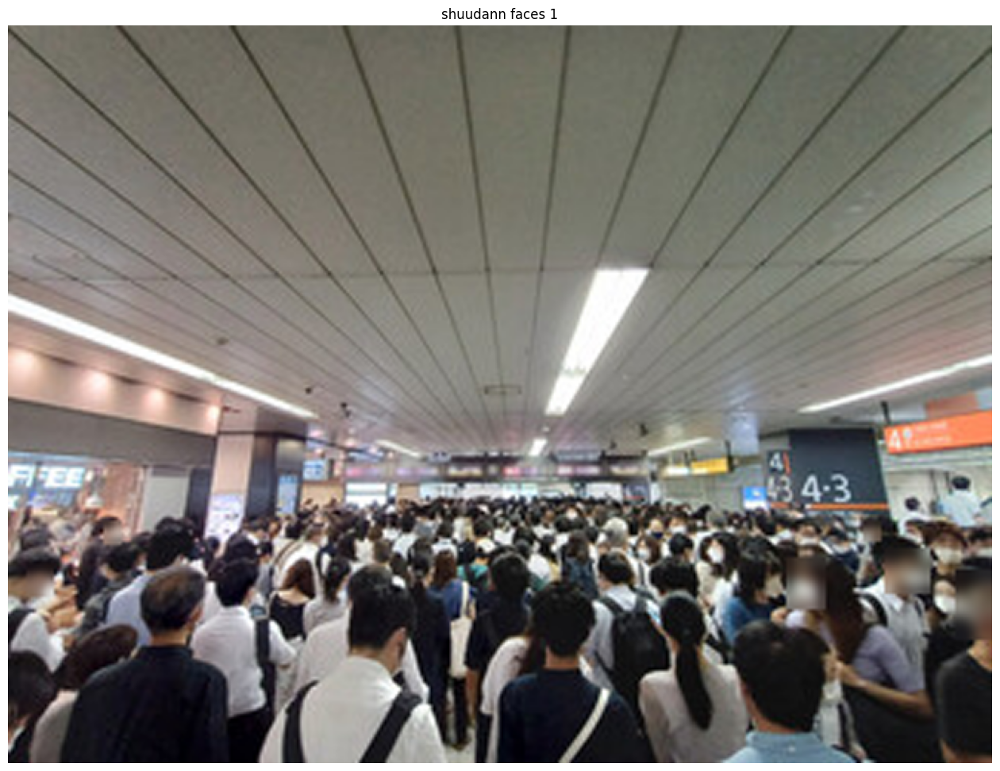

In [57]:
# 顔領域を強くぼかして高解像度で保存（関数化）：blur_faces(image_path) を定義・実行
import cv2
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt

def blur_faces(image_path):
    """
    blur_faces(image_path): YOLO で検出して顔領域を強くぼかす関数。
    引数は image_path のみ（文字列または Path）。
    """
    image_path = Path(image_path)
    model_path = Path('yolov8m-face.pt')
    from ultralytics import YOLO
    model = YOLO(model_path)
    result = model.predict(source=str(image_path), conf=0.25, verbose=False, imgsz=1280)[0]

    # 画像を読み込む
    img = cv2.imread(str(image_path))
    if img is None:
        raise FileNotFoundError(f'Image not found: {image_path}')
    h_img, w_img = img.shape[:2]
    out = img.copy()  # 出力用にコピー

    # 検出された顔ごとに処理
    for box in result.boxes.xyxy.cpu().numpy():
        x1, y1, x2, y2 = map(int, box)
        if x2 <= x1 or y2 <= y1:
            continue  # 異常なボックスはスキップ
        w = x2 - x1
        h = y2 - y1
        pad = int(max(w, h) * 0.2)  # 顔の周囲に20%のバッファを追加
        x1p = max(0, x1 - pad)
        y1p = max(0, y1 - pad)
        x2p = min(w_img, x2 + pad)
        y2p = min(h_img, y2 + pad)
        face = out[y1p:y2p, x1p:x2p]  # 顔領域を切り出し
        if face.size == 0:
            continue  # 領域が空ならスキップ
        # ブラーのカーネルサイズを決定（顔サイズに応じて大きめに設定）
        k = max(5, min(face.shape[0], face.shape[1]) // 2)
        if k % 2 == 0:
            k += 1  # カーネルサイズは奇数にする必要あり
        # 2回ガウシアンブラーをかけて強くぼかす
        face_blur = cv2.GaussianBlur(face, (k, k), 0)
        face_blur = cv2.GaussianBlur(face_blur, (k, k), 0)
        out[y1p:y2p, x1p:x2p] = face_blur  # ぼかした顔を元画像に貼り付け

    # 画像全体を2倍にアップスケールして高解像度で保存
    up = cv2.resize(out, (w_img*2, h_img*2), interpolation=cv2.INTER_CUBIC)
    output_path = image_path.with_name(image_path.stem + '_blur_faces.jpg')
    cv2.imwrite(str(output_path), up)
    print(f'ぼかし画像を保存しました: {output_path} ')

    # 結果を表示
    plt.figure(figsize=(16,16))
    plt.imshow(cv2.cvtColor(up, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('shuudann faces 1')
    plt.show()

# 関数を実行（reitaku.jpg を引数として渡す）
blur_faces('240_F_533045957_8QzyF3ruKMPzNQQypsEyqtGWdvq2hnSt.jpg')

置換画像を保存しました: 240_F_533045957_8QzyF3ruKMPzNQQypsEyqtGWdvq2hnSt_smile_replace.jpg 


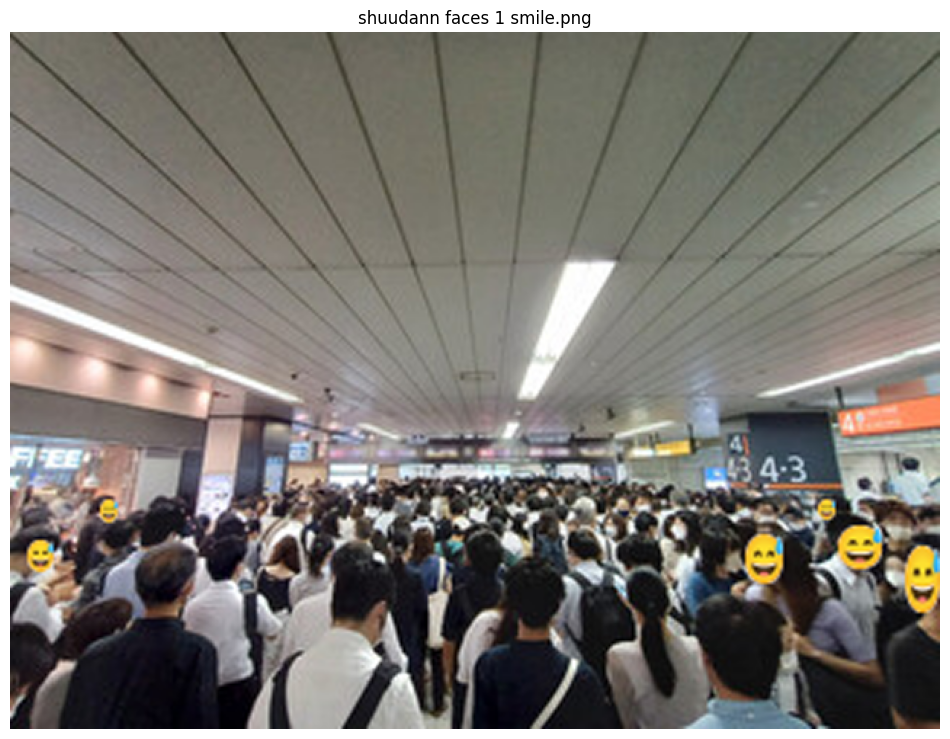

In [58]:
# 顔領域を画像で置き換えて高解像度で保存（関数化）：replace_faces(image_path, replace_image_path) を定義・実行
import cv2
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt

def replace_faces(image_path, replace_image_path):
    """
    replace_faces(image_path, replace_image_path): YOLO で検出して検出領域を指定画像で置換する関数。
    引数は image_path と replace_image_path（どちらも文字列または Path）。
    """
    image_path = Path(image_path)
    replace_image_path = Path(replace_image_path)
    model_path = Path('yolov8m-face.pt')
    from ultralytics import YOLO
    model = YOLO(model_path)
    result = model.predict(source=str(image_path), conf=0.25, verbose=False, imgsz=1280)[0]

    # 置換に使う画像を確認（アルファチャネル対応 PNG を想定）
    if not replace_image_path.exists():
        raise FileNotFoundError(f'{replace_image_path} が作業ディレクトリに見つかりません')
    repl = cv2.imread(str(replace_image_path), cv2.IMREAD_UNCHANGED)
    if repl is None:
        raise FileNotFoundError(f'Failed to read replacement image: {replace_image_path}')

    img = cv2.imread(str(image_path))
    if img is None:
        raise FileNotFoundError(f'Image not found: {image_path}')
    h_img, w_img = img.shape[:2]
    out = img.copy()

    for box in result.boxes.xyxy.cpu().numpy():
        # 検出ボックスを整数化
        x1, y1, x2, y2 = map(int, box)
        if x2 <= x1 or y2 <= y1:
            continue

        # 顔サイズとバッファ（20%）を計算
        w = x2 - x1
        h = y2 - y1
        pad = int(max(w, h) * 0.2)
        x1p = max(0, x1 - pad)
        y1p = max(0, y1 - pad)
        x2p = min(w_img, x2 + pad)
        y2p = min(h_img, y2 + pad)
        w_p = max(1, x2p - x1p)
        h_p = max(1, y2p - y1p)

        # 置き換え画像が空でないか確認
        if repl.shape[1] == 0 or repl.shape[0] == 0:
            continue

        # 顔領域（バッファ込み）の大きさにリサイズ
        repl_resized = cv2.resize(repl, (w_p, h_p), interpolation=cv2.INTER_AREA)

        # アルファチャネルがある場合はブレンド
        if repl_resized.shape[2] == 4:
            alpha = repl_resized[:, :, 3] / 255.0
            for c in range(3):
                out[y1p:y2p, x1p:x2p, c] = (
                    alpha * repl_resized[:, :, c] +
                    (1 - alpha) * out[y1p:y2p, x1p:x2p, c]
                )
        else:
            out[y1p:y2p, x1p:x2p] = repl_resized[:, :, :3]

    # 仕上げに 2 倍スケールで高解像度保存（CUBIC で滑らかに拡大）
    up = cv2.resize(out, (w_img * 2, h_img * 2), interpolation=cv2.INTER_CUBIC)
    output_path = image_path.with_name(image_path.stem + '_smile_replace.jpg')
    cv2.imwrite(str(output_path), up)
    print(f'置換画像を保存しました: {output_path} ')

    # プレビュー表示
    plt.figure(figsize=(12, 12))
    plt.imshow(cv2.cvtColor(up, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('shuudann faces 1 smile.png')
    plt.show()

# 関数を実行（reitaku.jpg を引数として渡す。置換画像は smile.png）
replace_faces('240_F_533045957_8QzyF3ruKMPzNQQypsEyqtGWdvq2hnSt.jpg', 'smile.png')

ぼかし画像を保存しました: 240_F_94124924_wPmICWypNd53ZBcLGC5oulJor43l461q_blur_faces.jpg 


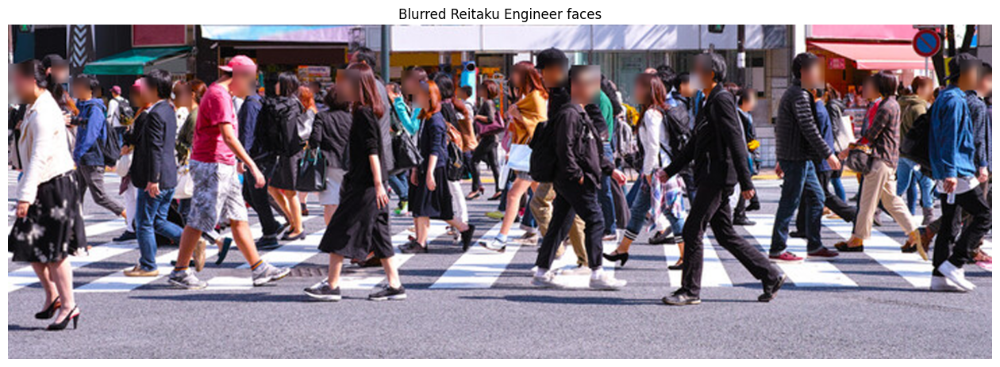

In [59]:
# 顔領域を強くぼかして高解像度で保存（関数化）：blur_faces(image_path) を定義・実行
import cv2
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt

def blur_faces(image_path):
    """
    blur_faces(image_path): YOLO で検出して顔領域を強くぼかす関数。
    引数は image_path のみ（文字列または Path）。
    """
    image_path = Path(image_path)
    model_path = Path('yolov8m-face.pt')
    from ultralytics import YOLO
    model = YOLO(model_path)
    result = model.predict(source=str(image_path), conf=0.25, verbose=False, imgsz=1280)[0]

    # 画像を読み込む
    img = cv2.imread(str(image_path))
    if img is None:
        raise FileNotFoundError(f'Image not found: {image_path}')
    h_img, w_img = img.shape[:2]
    out = img.copy()  # 出力用にコピー

    # 検出された顔ごとに処理
    for box in result.boxes.xyxy.cpu().numpy():
        x1, y1, x2, y2 = map(int, box)
        if x2 <= x1 or y2 <= y1:
            continue  # 異常なボックスはスキップ
        w = x2 - x1
        h = y2 - y1
        pad = int(max(w, h) * 0.2)  # 顔の周囲に20%のバッファを追加
        x1p = max(0, x1 - pad)
        y1p = max(0, y1 - pad)
        x2p = min(w_img, x2 + pad)
        y2p = min(h_img, y2 + pad)
        face = out[y1p:y2p, x1p:x2p]  # 顔領域を切り出し
        if face.size == 0:
            continue  # 領域が空ならスキップ
        # ブラーのカーネルサイズを決定（顔サイズに応じて大きめに設定）
        k = max(5, min(face.shape[0], face.shape[1]) // 2)
        if k % 2 == 0:
            k += 1  # カーネルサイズは奇数にする必要あり
        # 2回ガウシアンブラーをかけて強くぼかす
        face_blur = cv2.GaussianBlur(face, (k, k), 0)
        face_blur = cv2.GaussianBlur(face_blur, (k, k), 0)
        out[y1p:y2p, x1p:x2p] = face_blur  # ぼかした顔を元画像に貼り付け

    # 画像全体を2倍にアップスケールして高解像度で保存
    up = cv2.resize(out, (w_img*2, h_img*2), interpolation=cv2.INTER_CUBIC)
    output_path = image_path.with_name(image_path.stem + '_blur_faces.jpg')
    cv2.imwrite(str(output_path), up)
    print(f'ぼかし画像を保存しました: {output_path} ')

    # 結果を表示
    plt.figure(figsize=(16,16))
    plt.imshow(cv2.cvtColor(up, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Blurred Reitaku Engineer faces')
    plt.show()

# 関数を実行（reitaku.jpg を引数として渡す）
blur_faces('240_F_94124924_wPmICWypNd53ZBcLGC5oulJor43l461q.jpg')

置換画像を保存しました: 240_F_94124924_wPmICWypNd53ZBcLGC5oulJor43l461q_smile_replace.jpg 


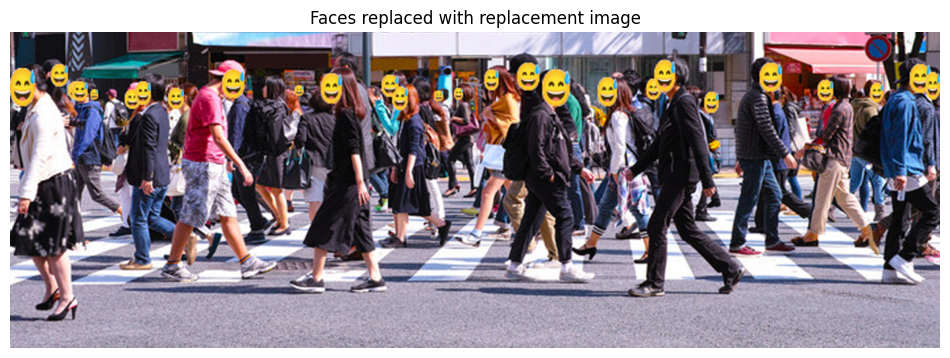

In [60]:
# 顔領域を画像で置き換えて高解像度で保存（関数化）：replace_faces(image_path, replace_image_path) を定義・実行
import cv2
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt

def replace_faces(image_path, replace_image_path):
    """
    replace_faces(image_path, replace_image_path): YOLO で検出して検出領域を指定画像で置換する関数。
    引数は image_path と replace_image_path（どちらも文字列または Path）。
    """
    image_path = Path(image_path)
    replace_image_path = Path(replace_image_path)
    model_path = Path('yolov8m-face.pt')
    from ultralytics import YOLO
    model = YOLO(model_path)
    result = model.predict(source=str(image_path), conf=0.25, verbose=False, imgsz=1280)[0]

    # 置換に使う画像を確認（アルファチャネル対応 PNG を想定）
    if not replace_image_path.exists():
        raise FileNotFoundError(f'{replace_image_path} が作業ディレクトリに見つかりません')
    repl = cv2.imread(str(replace_image_path), cv2.IMREAD_UNCHANGED)
    if repl is None:
        raise FileNotFoundError(f'Failed to read replacement image: {replace_image_path}')

    img = cv2.imread(str(image_path))
    if img is None:
        raise FileNotFoundError(f'Image not found: {image_path}')
    h_img, w_img = img.shape[:2]
    out = img.copy()

    for box in result.boxes.xyxy.cpu().numpy():
        # 検出ボックスを整数化
        x1, y1, x2, y2 = map(int, box)
        if x2 <= x1 or y2 <= y1:
            continue

        # 顔サイズとバッファ（20%）を計算
        w = x2 - x1
        h = y2 - y1
        pad = int(max(w, h) * 0.2)
        x1p = max(0, x1 - pad)
        y1p = max(0, y1 - pad)
        x2p = min(w_img, x2 + pad)
        y2p = min(h_img, y2 + pad)
        w_p = max(1, x2p - x1p)
        h_p = max(1, y2p - y1p)

        # 置き換え画像が空でないか確認
        if repl.shape[1] == 0 or repl.shape[0] == 0:
            continue

        # 顔領域（バッファ込み）の大きさにリサイズ
        repl_resized = cv2.resize(repl, (w_p, h_p), interpolation=cv2.INTER_AREA)

        # アルファチャネルがある場合はブレンド
        if repl_resized.shape[2] == 4:
            alpha = repl_resized[:, :, 3] / 255.0
            for c in range(3):
                out[y1p:y2p, x1p:x2p, c] = (
                    alpha * repl_resized[:, :, c] +
                    (1 - alpha) * out[y1p:y2p, x1p:x2p, c]
                )
        else:
            out[y1p:y2p, x1p:x2p] = repl_resized[:, :, :3]

    # 仕上げに 2 倍スケールで高解像度保存（CUBIC で滑らかに拡大）
    up = cv2.resize(out, (w_img * 2, h_img * 2), interpolation=cv2.INTER_CUBIC)
    output_path = image_path.with_name(image_path.stem + '_smile_replace.jpg')
    cv2.imwrite(str(output_path), up)
    print(f'置換画像を保存しました: {output_path} ')

    # プレビュー表示
    plt.figure(figsize=(12, 12))
    plt.imshow(cv2.cvtColor(up, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Faces replaced with replacement image')
    plt.show()

# 関数を実行（reitaku.jpg を引数として渡す。置換画像は smile.png）
replace_faces('240_F_94124924_wPmICWypNd53ZBcLGC5oulJor43l461q.jpg', 'smile.png')

どちらの画像もそれぞれ、顔にぼかしや画像を挿入することができました！

#水中画像の検証
次は水中の画像を主にして検証していきたいと思います！
これらの画像はシュノーケルやゴーグルなど顔を覆うものがあったり、暗い場所であったり、魚の顔映っていたりしているため面白い検証結果が生まれると思います！

検出された顔の数: 1 faces


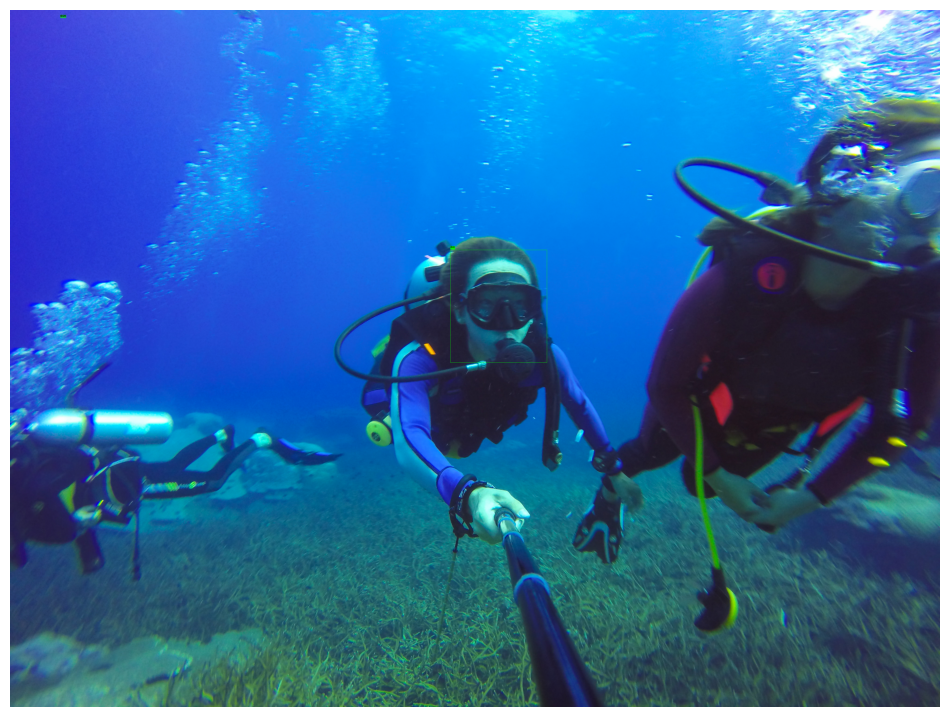

In [61]:
import cv2
from pathlib import Path
from ultralytics import YOLO
import matplotlib.pyplot as plt

# 画像とモデルの準備
image_path = Path("nu-xinghotomufurohoti-cheng-ren.jpg")
model_path = Path("yolov8m-face.pt")

model = YOLO(model_path)
result = model.predict(source=str(image_path), conf=0.25, verbose=False, imgsz=1280)[0]

# 画像読み込み
annotated = cv2.imread(str(image_path))
h_img, w_img = annotated.shape[:2]

# ★ 小さめのラベルサイズ
font_scale = 0.3
thickness = 1
color = (0, 255, 0)

# ---- ラベル背景（半透明） ----
overlay = annotated.copy()
alpha = 0.4   # ← 透明度（0〜1） 小さいほど薄い

# 半透明背景矩形
cv2.rectangle(
    overlay,
    (x1p, y_label - h_label - baseline),
    (x1p + w_label, y_label + baseline),
    color,
    -1
)

# αブレンド（overlay と annotated を合成）
cv2.addWeighted(overlay, alpha, annotated, 1 - alpha, 0, annotated)

# ---- 文字 ----
cv2.putText(
    annotated,
    label,
    (x1p, y_label - baseline),
    cv2.FONT_HERSHEY_SIMPLEX,
    font_scale,
    (0, 0, 0),
    thickness,
    cv2.LINE_AA
)

# ---- ラベル背景（半透明） ----
overlay = annotated.copy()
alpha = 0.4   # ← 透明度（0〜1） 小さいほど薄い

# 半透明背景矩形
cv2.rectangle(
    overlay,
    (x1p, y_label - h_label - baseline),
    (x1p + w_label, y_label + baseline),
    color,
    -1
)

# αブレンド（overlay と annotated を合成）
cv2.addWeighted(overlay, alpha, annotated, 1 - alpha, 0, annotated)

# ---- 文字 ----
cv2.putText(
    annotated,
    label,
    (x1p, y_label - baseline),
    cv2.FONT_HERSHEY_SIMPLEX,
    font_scale,
    (0, 0, 0),
    thickness,
    cv2.LINE_AA
)

# 描画
for idx, box in enumerate(result.boxes.xyxy.cpu().numpy()):
    x1, y1, x2, y2 = map(int, box)
    w = x2 - x1
    h = h = y2 - y1
    pad = int(max(w, h) * 0.2)

    x1p = max(0, x1 - pad)
    y1p = max(0, y1 - pad)
    x2p = min(w_img, x2 + pad)
    y2p = min(h_img, y2 + pad)

    # ボックス
    cv2.rectangle(annotated, (x1p, y1p), (x2p, y2p), color, thickness)

    # ラベル
    label = f"ID:{idx}"
    (w_label, h_label), baseline = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    y_label = y1p - 6 if y1p - 6 > h_label else y1p + h_label + 6

    cv2.rectangle(annotated, (x1p, y_label - h_label - baseline),
                  (x1p + w_label, y_label + baseline), color, -1)

    cv2.putText(annotated, label, (x1p, y_label - baseline),
                cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 0, 0),
                thickness, cv2.LINE_AA)

# ★ アップスケールしないで保存
output_path = Path("shuno-keru_yolo_faces_fixed.jpg")
cv2.imwrite(str(output_path), annotated)

print(f"検出された顔の数: {len(result.boxes)} faces")

# ★ 表示だけ拡大
plt.figure(figsize=(12, 12))
plt.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


#結果
比較的暗い水中でも問題なく検出可能。
ゴーグルやシュノーケルなどがあっても検出は可能だが、ゴーグルが曇っていたり、泡が邪魔している場合は検出できない。

ぼかし画像を保存しました: shuno-keru_yolo_faces_fixed_blur_faces.jpg 


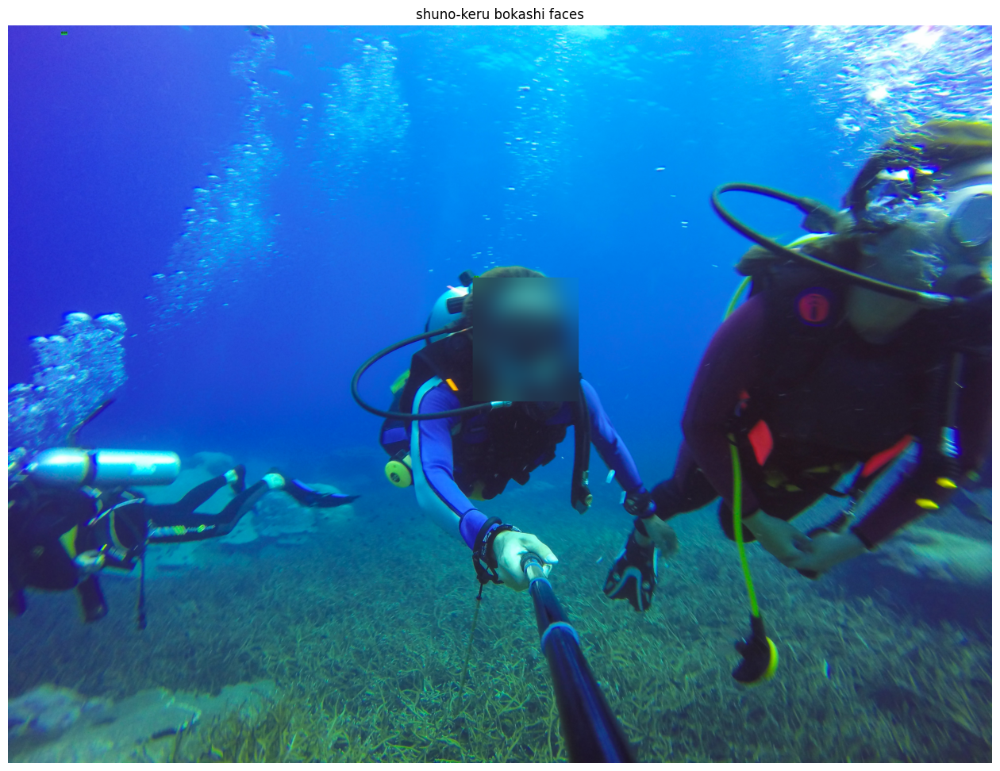

In [62]:
# 顔領域を強くぼかして高解像度で保存（関数化）：blur_faces(image_path) を定義・実行
import cv2
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt

def blur_faces(image_path):
    """
    blur_faces(image_path): YOLO で検出して顔領域を強くぼかす関数。
    引数は image_path のみ（文字列または Path）。
    """
    image_path = Path(image_path)
    model_path = Path('yolov8m-face.pt')
    from ultralytics import YOLO
    model = YOLO(model_path)
    result = model.predict(source=str(image_path), conf=0.25, verbose=False, imgsz=1280)[0]

    # 画像を読み込む
    img = cv2.imread(str(image_path))
    if img is None:
        raise FileNotFoundError(f'Image not found: {image_path}')
    h_img, w_img = img.shape[:2]
    out = img.copy()  # 出力用にコピー

    # 検出された顔ごとに処理
    for box in result.boxes.xyxy.cpu().numpy():
        x1, y1, x2, y2 = map(int, box)
        if x2 <= x1 or y2 <= y1:
            continue  # 異常なボックスはスキップ
        w = x2 - x1
        h = y2 - y1
        pad = int(max(w, h) * 0.2)  # 顔の周囲に20%のバッファを追加
        x1p = max(0, x1 - pad)
        y1p = max(0, y1 - pad)
        x2p = min(w_img, x2 + pad)
        y2p = min(h_img, y2 + pad)
        face = out[y1p:y2p, x1p:x2p]  # 顔領域を切り出し
        if face.size == 0:
            continue  # 領域が空ならスキップ
        # ブラーのカーネルサイズを決定（顔サイズに応じて大きめに設定）
        k = max(5, min(face.shape[0], face.shape[1]) // 2)
        if k % 2 == 0:
            k += 1  # カーネルサイズは奇数にする必要あり
        # 2回ガウシアンブラーをかけて強くぼかす
        face_blur = cv2.GaussianBlur(face, (k, k), 0)
        face_blur = cv2.GaussianBlur(face_blur, (k, k), 0)
        out[y1p:y2p, x1p:x2p] = face_blur  # ぼかした顔を元画像に貼り付け

    # 画像全体を2倍にアップスケールして高解像度で保存
    up = cv2.resize(out, (w_img*2, h_img*2), interpolation=cv2.INTER_CUBIC)
    output_path = image_path.with_name(image_path.stem + '_blur_faces.jpg')
    cv2.imwrite(str(output_path), up)
    print(f'ぼかし画像を保存しました: {output_path} ')

    # 結果を表示
    plt.figure(figsize=(16,16))
    plt.imshow(cv2.cvtColor(up, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('shuno-keru bokashi faces')
    plt.show()

# 関数を実行（reitaku.jpg を引数として渡す）
blur_faces('shuno-keru_yolo_faces_fixed.jpg')

検出された顔の数: 2 faces


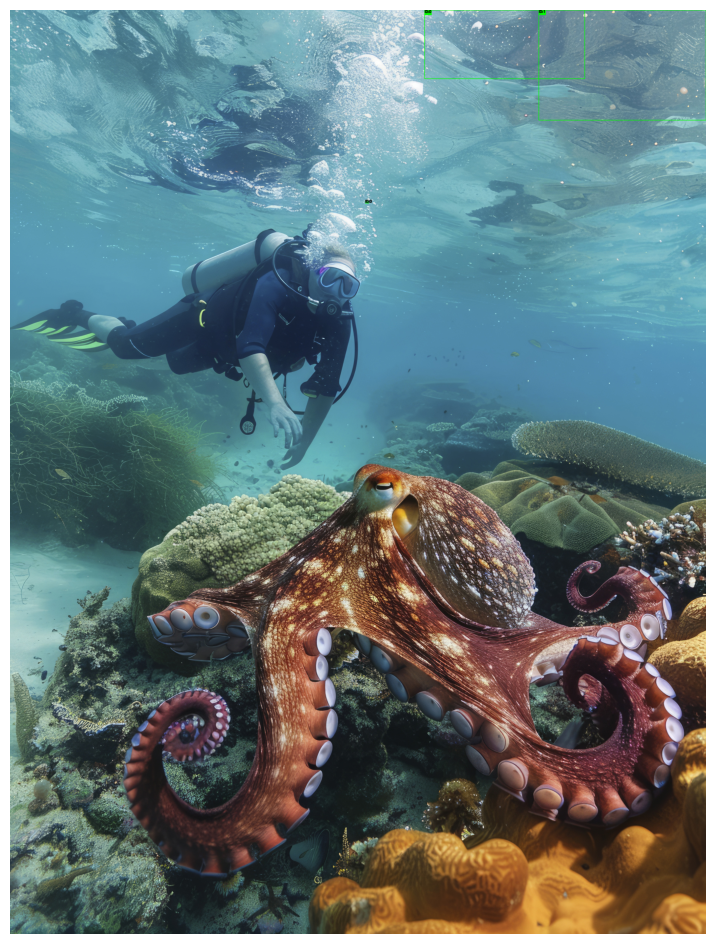

In [63]:
import cv2
from pathlib import Path
from ultralytics import YOLO
import matplotlib.pyplot as plt

# 画像とモデルの準備
image_path = Path("shui-zhong-no-zi-ran-no-sheng-xi-de-te-jian-rare-te-iru-zhang-yu.jpg")
model_path = Path("yolov8m-face.pt")

model = YOLO(model_path)
result = model.predict(source=str(image_path), conf=0.25, verbose=False, imgsz=1280)[0]

# 画像読み込み
annotated = cv2.imread(str(image_path))
h_img, w_img = annotated.shape[:2]

# ★ 小さめのラベルサイズ
font_scale = 0.6
thickness = 2
color = (0, 255, 0)

# ---- ラベル背景（半透明） ----
overlay = annotated.copy()
alpha = 0.4   # ← 透明度（0〜1） 小さいほど薄い

# 半透明背景矩形
cv2.rectangle(
    overlay,
    (x1p, y_label - h_label - baseline),
    (x1p + w_label, y_label + baseline),
    color,
    -1
)

# αブレンド（overlay と annotated を合成）
cv2.addWeighted(overlay, alpha, annotated, 1 - alpha, 0, annotated)

# ---- 文字 ----
cv2.putText(
    annotated,
    label,
    (x1p, y_label - baseline),
    cv2.FONT_HERSHEY_SIMPLEX,
    font_scale,
    (0, 0, 0),
    thickness,
    cv2.LINE_AA
)

# ---- ラベル背景（半透明） ----
overlay = annotated.copy()
alpha = 0.4   # ← 透明度（0〜1） 小さいほど薄い

# 半透明背景矩形
cv2.rectangle(
    overlay,
    (x1p, y_label - h_label - baseline),
    (x1p + w_label, y_label + baseline),
    color,
    -1
)

# αブレンド（overlay と annotated を合成）
cv2.addWeighted(overlay, alpha, annotated, 1 - alpha, 0, annotated)

# ---- 文字 ----
cv2.putText(
    annotated,
    label,
    (x1p, y_label - baseline),
    cv2.FONT_HERSHEY_SIMPLEX,
    font_scale,
    (0, 0, 0),
    thickness,
    cv2.LINE_AA
)

# 描画
for idx, box in enumerate(result.boxes.xyxy.cpu().numpy()):
    x1, y1, x2, y2 = map(int, box)
    w = x2 - x1
    h = h = y2 - y1
    pad = int(max(w, h) * 0.2)

    x1p = max(0, x1 - pad)
    y1p = max(0, y1 - pad)
    x2p = min(w_img, x2 + pad)
    y2p = min(h_img, y2 + pad)

    # ボックス
    cv2.rectangle(annotated, (x1p, y1p), (x2p, y2p), color, thickness)

    # ラベル
    label = f"ID:{idx}"
    (w_label, h_label), baseline = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    y_label = y1p - 6 if y1p - 6 > h_label else y1p + h_label + 6

    cv2.rectangle(annotated, (x1p, y_label - h_label - baseline),
                  (x1p + w_label, y_label + baseline), color, -1)

    cv2.putText(annotated, label, (x1p, y_label - baseline),
                cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 0, 0),
                thickness, cv2.LINE_AA)

# ★ アップスケールしないで保存
output_path = Path("shuno-keru with tako_yolo_faces_fixed.jpg")
cv2.imwrite(str(output_path), annotated)

print(f"検出された顔の数: {len(result.boxes)} faces")

# ★ 表示だけ拡大
plt.figure(figsize=(12, 12))
plt.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


#結果
今回は女性の顔を検出せずに右上の空間になぜか二つ検出されました。
これは、女性のゴーグルがこもっていることや、泡で顔全体が覆われてしまっているのが原因だと考えられます。
さすがにたこには反応しません。

次は検出した顔に画像を挿入します。

置換画像を保存しました: shui-zhong-no-zi-ran-no-sheng-xi-de-te-jian-rare-te-iru-zhang-yu_smile_replace.jpg 


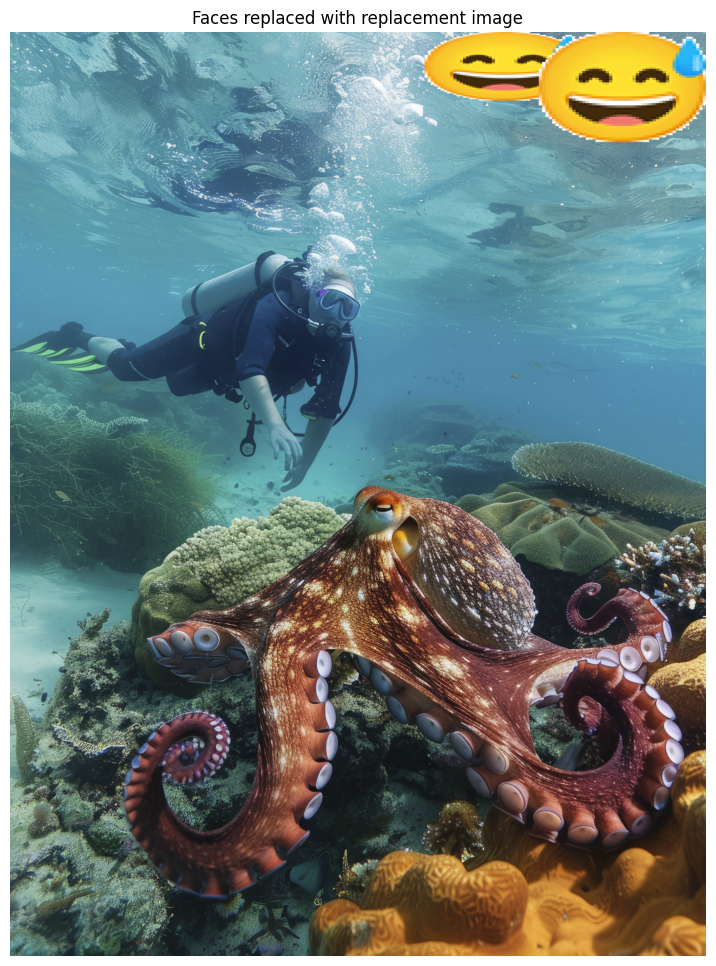

In [64]:
# 顔領域を画像で置き換えて高解像度で保存（関数化）：replace_faces(image_path, replace_image_path) を定義・実行
import cv2
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt

def replace_faces(image_path, replace_image_path):
    """
    replace_faces(image_path, replace_image_path): YOLO で検出して検出領域を指定画像で置換する関数。
    引数は image_path と replace_image_path（どちらも文字列または Path）。
    """
    image_path = Path(image_path)
    replace_image_path = Path(replace_image_path)
    model_path = Path('yolov8m-face.pt')
    from ultralytics import YOLO
    model = YOLO(model_path)
    result = model.predict(source=str(image_path), conf=0.25, verbose=False, imgsz=1280)[0]

    # 置換に使う画像を確認（アルファチャネル対応 PNG を想定）
    if not replace_image_path.exists():
        raise FileNotFoundError(f'{replace_image_path} が作業ディレクトリに見つかりません')
    repl = cv2.imread(str(replace_image_path), cv2.IMREAD_UNCHANGED)
    if repl is None:
        raise FileNotFoundError(f'Failed to read replacement image: {replace_image_path}')

    img = cv2.imread(str(image_path))
    if img is None:
        raise FileNotFoundError(f'Image not found: {image_path}')
    h_img, w_img = img.shape[:2]
    out = img.copy()

    for box in result.boxes.xyxy.cpu().numpy():
        # 検出ボックスを整数化
        x1, y1, x2, y2 = map(int, box)
        if x2 <= x1 or y2 <= y1:
            continue

        # 顔サイズとバッファ（20%）を計算
        w = x2 - x1
        h = y2 - y1
        pad = int(max(w, h) * 0.2)
        x1p = max(0, x1 - pad)
        y1p = max(0, y1 - pad)
        x2p = min(w_img, x2 + pad)
        y2p = min(h_img, y2 + pad)
        w_p = max(1, x2p - x1p)
        h_p = max(1, y2p - y1p)

        # 置き換え画像が空でないか確認
        if repl.shape[1] == 0 or repl.shape[0] == 0:
            continue

        # 顔領域（バッファ込み）の大きさにリサイズ
        repl_resized = cv2.resize(repl, (w_p, h_p), interpolation=cv2.INTER_AREA)

        # アルファチャネルがある場合はブレンド
        if repl_resized.shape[2] == 4:
            alpha = repl_resized[:, :, 3] / 255.0
            for c in range(3):
                out[y1p:y2p, x1p:x2p, c] = (
                    alpha * repl_resized[:, :, c] +
                    (1 - alpha) * out[y1p:y2p, x1p:x2p, c]
                )
        else:
            out[y1p:y2p, x1p:x2p] = repl_resized[:, :, :3]

    # 仕上げに 2 倍スケールで高解像度保存（CUBIC で滑らかに拡大）
    up = cv2.resize(out, (w_img * 2, h_img * 2), interpolation=cv2.INTER_CUBIC)
    output_path = image_path.with_name(image_path.stem + '_smile_replace.jpg')
    cv2.imwrite(str(output_path), up)
    print(f'置換画像を保存しました: {output_path} ')

    # プレビュー表示
    plt.figure(figsize=(12, 12))
    plt.imshow(cv2.cvtColor(up, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Faces replaced with replacement image')
    plt.show()

# 関数を実行（reitaku.jpg を引数として渡す。置換画像は smile.png）
replace_faces('shui-zhong-no-zi-ran-no-sheng-xi-de-te-jian-rare-te-iru-zhang-yu.jpg', 'smile.png')

やはり右上の水面に反応しているようです。
水面の光の反射を顔だと判断してしまったようです。

水中画像の最後の画像を検証していきます！

検出された顔の数: 1 faces


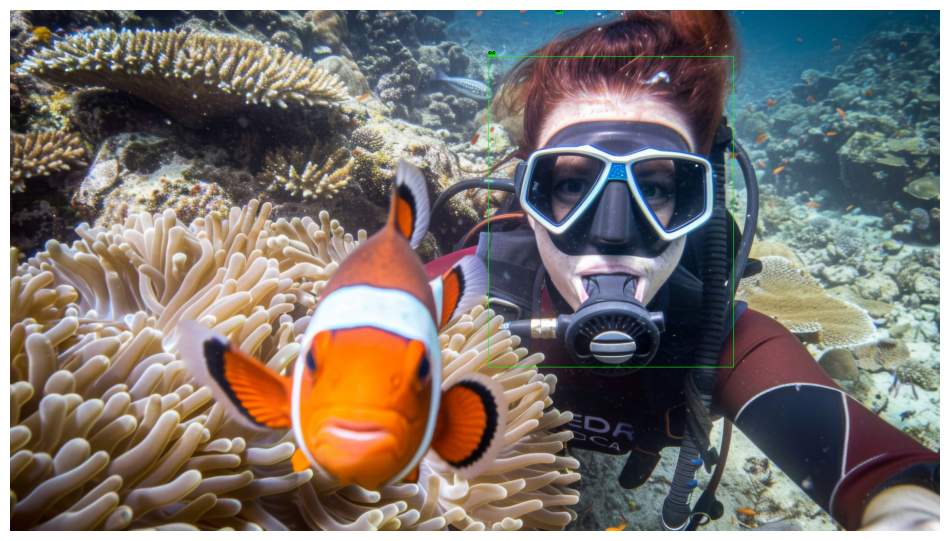

In [65]:
import cv2
from pathlib import Path
from ultralytics import YOLO
import matplotlib.pyplot as plt

# 画像とモデルの準備
image_path = Path("haino-shi-jiewo-tan-suosurusukyuhataihano-shui-zhong-xiao-xiang-hua.jpg")
model_path = Path("yolov8m-face.pt")

model = YOLO(model_path)
result = model.predict(source=str(image_path), conf=0.25, verbose=False, imgsz=1280)[0]

# 画像読み込み
annotated = cv2.imread(str(image_path))
h_img, w_img = annotated.shape[:2]

# ★ 小さめのラベルサイズ
font_scale = 0.6
thickness = 2
color = (0, 255, 0)

# ---- ラベル背景（半透明） ----
overlay = annotated.copy()
alpha = 0.4   # ← 透明度（0〜1） 小さいほど薄い

# 半透明背景矩形
cv2.rectangle(
    overlay,
    (x1p, y_label - h_label - baseline),
    (x1p + w_label, y_label + baseline),
    color,
    -1
)

# αブレンド（overlay と annotated を合成）
cv2.addWeighted(overlay, alpha, annotated, 1 - alpha, 0, annotated)

# ---- 文字 ----
cv2.putText(
    annotated,
    label,
    (x1p, y_label - baseline),
    cv2.FONT_HERSHEY_SIMPLEX,
    font_scale,
    (0, 0, 0),
    thickness,
    cv2.LINE_AA
)

# ---- ラベル背景（半透明） ----
overlay = annotated.copy()
alpha = 0.4   # ← 透明度（0〜1） 小さいほど薄い

# 半透明背景矩形
cv2.rectangle(
    overlay,
    (x1p, y_label - h_label - baseline),
    (x1p + w_label, y_label + baseline),
    color,
    -1
)

# αブレンド（overlay と annotated を合成）
cv2.addWeighted(overlay, alpha, annotated, 1 - alpha, 0, annotated)

# ---- 文字 ----
cv2.putText(
    annotated,
    label,
    (x1p, y_label - baseline),
    cv2.FONT_HERSHEY_SIMPLEX,
    font_scale,
    (0, 0, 0),
    thickness,
    cv2.LINE_AA
)

# 描画
for idx, box in enumerate(result.boxes.xyxy.cpu().numpy()):
    x1, y1, x2, y2 = map(int, box)
    w = x2 - x1
    h = h = y2 - y1
    pad = int(max(w, h) * 0.2)

    x1p = max(0, x1 - pad)
    y1p = max(0, y1 - pad)
    x2p = min(w_img, x2 + pad)
    y2p = min(h_img, y2 + pad)

    # ボックス
    cv2.rectangle(annotated, (x1p, y1p), (x2p, y2p), color, thickness)

    # ラベル
    label = f"ID:{idx}"
    (w_label, h_label), baseline = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    y_label = y1p - 6 if y1p - 6 > h_label else y1p + h_label + 6

    cv2.rectangle(annotated, (x1p, y_label - h_label - baseline),
                  (x1p + w_label, y_label + baseline), color, -1)

    cv2.putText(annotated, label, (x1p, y_label - baseline),
                cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 0, 0),
                thickness, cv2.LINE_AA)

# ★ アップスケールしないで保存
output_path = Path("shuno-keru with fish_yolo_faces_fixed.jpg")
cv2.imwrite(str(output_path), annotated)

print(f"検出された顔の数: {len(result.boxes)} faces")

# ★ 表示だけ拡大
plt.figure(figsize=(12, 12))
plt.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


#結果
こちらは、画質の良さもあってかしっかりと顔を検出することができました。
やはり画像のクマノミのような人以外の動物には反応しないようです。

最後にこの画像にぼかしを付けていきたいと思います。

ぼかし画像を保存しました: haino-shi-jiewo-tan-suosurusukyuhataihano-shui-zhong-xiao-xiang-hua_blur_faces.jpg 


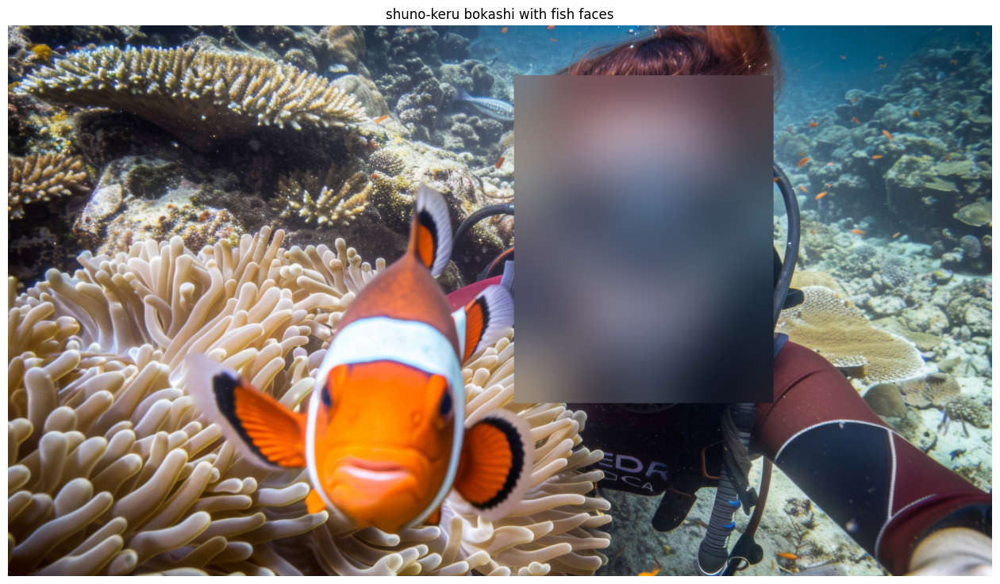

In [66]:
# 顔領域を強くぼかして高解像度で保存（関数化）：blur_faces(image_path) を定義・実行
import cv2
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt

def blur_faces(image_path):
    """
    blur_faces(image_path): YOLO で検出して顔領域を強くぼかす関数。
    引数は image_path のみ（文字列または Path）。
    """
    image_path = Path(image_path)
    model_path = Path('yolov8m-face.pt')
    from ultralytics import YOLO
    model = YOLO(model_path)
    result = model.predict(source=str(image_path), conf=0.25, verbose=False, imgsz=1280)[0]

    # 画像を読み込む
    img = cv2.imread(str(image_path))
    if img is None:
        raise FileNotFoundError(f'Image not found: {image_path}')
    h_img, w_img = img.shape[:2]
    out = img.copy()  # 出力用にコピー

    # 検出された顔ごとに処理
    for box in result.boxes.xyxy.cpu().numpy():
        x1, y1, x2, y2 = map(int, box)
        if x2 <= x1 or y2 <= y1:
            continue  # 異常なボックスはスキップ
        w = x2 - x1
        h = y2 - y1
        pad = int(max(w, h) * 0.2)  # 顔の周囲に20%のバッファを追加
        x1p = max(0, x1 - pad)
        y1p = max(0, y1 - pad)
        x2p = min(w_img, x2 + pad)
        y2p = min(h_img, y2 + pad)
        face = out[y1p:y2p, x1p:x2p]  # 顔領域を切り出し
        if face.size == 0:
            continue  # 領域が空ならスキップ
        # ブラーのカーネルサイズを決定（顔サイズに応じて大きめに設定）
        k = max(5, min(face.shape[0], face.shape[1]) // 2)
        if k % 2 == 0:
            k += 1  # カーネルサイズは奇数にする必要あり
        # 2回ガウシアンブラーをかけて強くぼかす
        face_blur = cv2.GaussianBlur(face, (k, k), 0)
        face_blur = cv2.GaussianBlur(face_blur, (k, k), 0)
        out[y1p:y2p, x1p:x2p] = face_blur  # ぼかした顔を元画像に貼り付け

    # 画像全体を2倍にアップスケールして高解像度で保存
    up = cv2.resize(out, (w_img*2, h_img*2), interpolation=cv2.INTER_CUBIC)
    output_path = image_path.with_name(image_path.stem + '_blur_faces.jpg')
    cv2.imwrite(str(output_path), up)
    print(f'ぼかし画像を保存しました: {output_path} ')

    # 結果を表示
    plt.figure(figsize=(16,16))
    plt.imshow(cv2.cvtColor(up, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('shuno-keru bokashi with fish faces')
    plt.show()

# 関数を実行（reitaku.jpg を引数として渡す）
blur_faces('haino-shi-jiewo-tan-suosurusukyuhataihano-shui-zhong-xiao-xiang-hua.jpg')

#まとめ
今回行った「集団での人数カウント」と「水中での顔検出」を応用すれば、次のような場面で大きく役に立つことができると考えられます。
・人数を素早く把握する必要がある場面（飛行機の搭乗数確認や刑務所での人数確認、アトラクションの待ち時間計算など）
・水中など人間が到達するのが難しい地点での遭難者や死体の発見（水中での遭難や被害状況の確認やエベレストなどの標高が高い地点での捜索など）
今回検証を行ったのは画像だけですが、動画にもこの顔検出、人数検出する機能は適用できるのでより大きな活躍gは期待できると思います。